# 环境变量
* 请先根据 `Readme.md` 准备测试集并修改 `config/config.yaml` 中的路径。
* 以下为一些用到的文件路径，请根据自己的具体存放位置进行修改。

In [ ]:
base_folder = '/home/kailu/voicefilter'
config_path = base_folder + 'config/config.yaml'
embedder_path = base_folder + 'embedder.pt'
checkpoint_path = base_folder + 'chkpt/first/model1_17000.pt'
model2_path = base_folder +  'chkpt/second/model2_24000.pt'

In [2]:
import sys
sys.path += [base_folder]

In [3]:
def plot_spectrogram(spectrogram):
    %matplotlib inline
    from matplotlib import pyplot as plt
    fig, ax = plt.subplots(figsize=(12, 3))
    im = ax.imshow(spectrogram, aspect='auto', origin='lower',
                   interpolation='none')
    plt.colorbar(im, ax=ax)
    plt.xlabel('Frames')
    plt.ylabel('Channels')
    plt.tight_layout()
    plt.show()

class TestWriter():
    def add_scalar(self, name, value, step):
        print(f"{name} = {value}")
    
    def add_audio(self, name, wav, step, sample_rate):
        from IPython import display
        librosa.output.write_wav('log_temp/' + name + '.wav', wav, sr=sample_rate)
        display.Audio('log_temp/' + name + '.wav', rate=sample_rate)
    
    def add_image(self, name, spectrogram, step):
        print(name)
        plot_spectrogram(spectrogram)
    
    def log_evaluation(self, test_loss, sdr,
                       mixed_wav, target_wav, est_wav, atk_wav,
                       mixed_spec, target_spec, est_spec, est_mask,
                       step):
        
        self.add_scalar('test_loss', test_loss, step)
        self.add_scalar('SDR', sdr, step)

        self.add_audio('mixed_wav', mixed_wav, step, 16000)
        self.add_audio('target_wav', target_wav, step, 16000)
        self.add_audio('estimated_wav', est_wav, step, 16000)
        self.add_audio('attacked_wav', atk_wav, step, 16000)

        self.add_image('data/mixed_spectrogram', mixed_spec, step)
        self.add_image('data/target_spectrogram', target_spec, step)
        self.add_image('result/estimated_spectrogram', est_spec, step)
        self.add_image('result/estimated_mask', est_mask, step)
        self.add_image('result/estimation_error_sq', np.square(est_spec - target_spec), step)

In [49]:
def validate(audio, model, embedder, testloader, writer, hacker, one_example, show_detail):
    from torch import nn
    from mir_eval.separation import bss_eval_sources
    
    model.eval()
    
    criterion = nn.MSELoss()
    cnt = 0
    avg_loss = 0
    avg_sdr = 0
    with torch.no_grad():
        for batch in testloader:
            dvec_mel, target_wav, mixed_wav, target_mag, mixed_mag, mixed_phase = batch[0]

            dvec_mel = dvec_mel.cuda()
            target_mag = target_mag.unsqueeze(0).cuda()
            mixed_mag = mixed_mag.unsqueeze(0).cuda()
            
            mixed_mag, dvec_mel = hacker(model, mixed_mag, embedder, dvec_mel)
            atk_wav = audio.spec2wav(mixed_mag[0].cpu().detach().numpy(), mixed_phase)
            
            dvec = embedder(dvec_mel)
            dvec = dvec.unsqueeze(0)
            est_mask = model(mixed_mag, dvec)
            est_mag = est_mask * mixed_mag
            test_loss = criterion(target_mag, est_mag).item()

            mixed_mag = mixed_mag[0].cpu().detach().numpy()
            target_mag = target_mag[0].cpu().detach().numpy()
            est_mag = est_mag[0].cpu().detach().numpy()
            est_wav = audio.spec2wav(est_mag, mixed_phase)
            est_mask = est_mask[0].cpu().detach().numpy()

            sdr = bss_eval_sources(target_wav, est_wav, False)[0][0]
            avg_loss += test_loss
            avg_sdr += sdr
            cnt += 1
            if show_detail:
                writer.log_evaluation(test_loss, sdr,
                                      mixed_wav, target_wav, est_wav, atk_wav,
                                      mixed_mag.T, target_mag.T, est_mag.T, est_mask.T, 0)
            if one_example:
                break
    model.train()
    
    print("avg_loss = ", avg_loss/cnt)
    print("avg_sdr = ", avg_sdr/cnt)

In [45]:
import os
import glob
import torch
import librosa
import argparse

from utils.audio import Audio
from utils.hparams import HParam
from model.model import VoiceFilter
from model.embedder import SpeechEmbedder
from datasets.dataloader import create_dataloader
import numpy as np

def test(args, hacker, one_example=True, show_detail=True):
    hp = HParam(args.config)
    testloader = create_dataloader(hp, args, train=False)
    
    # load embedder
    embedder_pt = torch.load(args.embedder_path)
    embedder = SpeechEmbedder(hp).cuda()
    embedder.load_state_dict(embedder_pt)
    embedder.eval()
    
    # load model
    model = VoiceFilter(hp).cuda()
    chkpt_model = torch.load(args.checkpoint_path)['model']
    model.load_state_dict(chkpt_model)
    model.eval()
    
    audio = Audio(hp)
    writer = TestWriter()
    
    validate(audio, model, embedder, testloader, writer, hacker, one_example, show_detail)

In [46]:
def noAttack(model, mixed_mag, embedder, dvec_mel):
    return mixed_mag, dvec_mel

In [47]:
class FakeArgs:
    pass
args = FakeArgs()
args.base_dir = base_folder
args.config = config_path
args.embedder_path = embedder_path
args.checkpoint_path = checkpoint_path
args.model = 'first'

test_loss = 0.007896140217781067
SDR = 2.7712003686324254
data/mixed_spectrogram


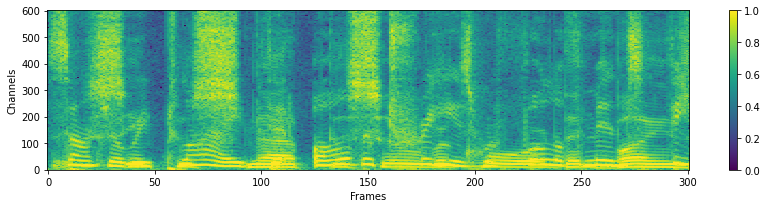

data/target_spectrogram


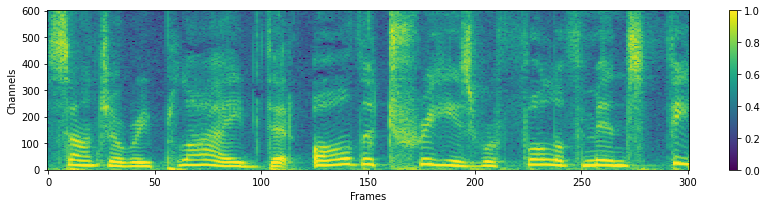

result/estimated_spectrogram


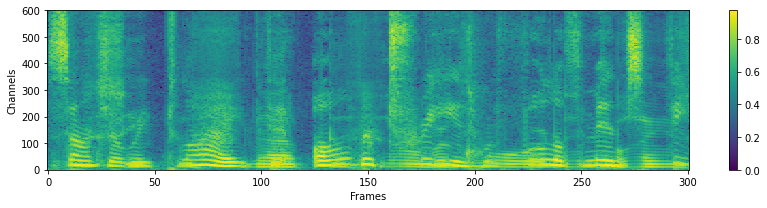

result/estimated_mask


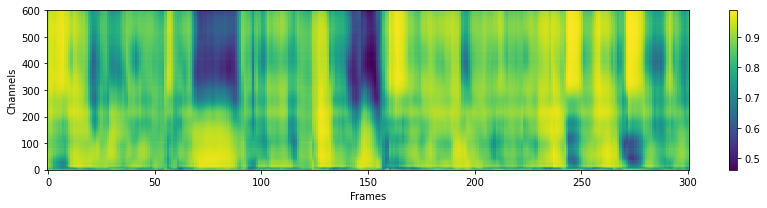

result/estimation_error_sq


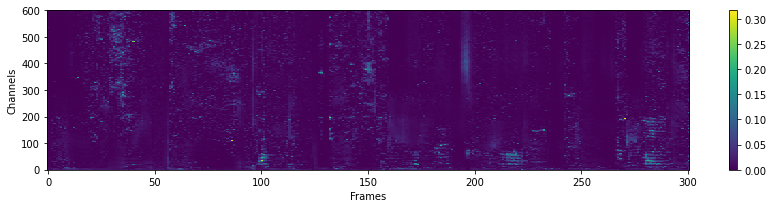

In [172]:
test(args, noAttack)

# White Box Attack

In [55]:
from torchattacks.attack import Attack
from torch import nn
from copy import deepcopy

class PGD(Attack):
    """
    Modified from PGD in torchattacks, maximize difference of output
    """
    def __init__(self, model, eps=0.3, alpha=2/255, steps=40, random_start=False, targeted=False):
        super(PGD, self).__init__("PGD", model)
        self.eps = eps
        self.alpha = alpha
        self.steps = steps
        self.random_start = random_start
        self.sign = 1
        if targeted:
            self.sign = -1

    def forward(self, images, dvec):
        images = images.to(self.device)
        with torch.no_grad():
            labels = self.model(images, dvec)
        loss = nn.MSELoss()

        adv_images = images.clone().detach()

        if self.random_start:
            # Starting at a uniformly random point
            adv_images = adv_images + torch.empty_like(adv_images).uniform_(-self.eps, self.eps)
            adv_images = torch.clamp(adv_images, min=0, max=1)
        
        self.model.train()  #  RNN BP need train mode
        for m in self.model.modules():
            if isinstance(m, nn.BatchNorm2d):
                m.eval()
        
        cost = 0
        for i in range(self.steps):
            adv_images.requires_grad = True
            outputs = self.model(adv_images, dvec)

            cost = self.sign*loss(outputs, labels).to(self.device)

            grad = torch.autograd.grad(cost, adv_images,
                                       retain_graph=False, create_graph=False)[0]
            adv_images = adv_images.detach() + self.alpha*grad.sign()
            delta = torch.clamp(adv_images - images, min=-self.eps, max=self.eps)
            adv_images = torch.clamp(images + delta, min=0, max=1).detach()
        self.model.eval()
#         print('cost = ', cost)
        return adv_images

VERBOSE_DIFF = True
def show_difference(mixed_mag, adv_mixed):
    if VERBOSE_DIFF:
        print("---------------difference between attacked and origin--------------")
        print("origin:")
        plot_spectrogram(mixed_mag[0].detach().cpu().T)
        print("attacked:")
        plot_spectrogram(adv_mixed[0].detach().cpu().T)
        print("diff:")
        plot_spectrogram(torch.abs(mixed_mag-adv_mixed)[0].detach().cpu().T)
        print("----------------compare end----------------------------------------")

def attackMixedOnly(model, mixed_mag, embedder, dvec_mel):
    with torch.no_grad():
        dvec = embedder(dvec_mel)
        dvec = dvec.unsqueeze(0)
    attack = PGD(model, eps=0.05, alpha=0.01, steps=7, random_start=True)
    with torch.enable_grad():
        adv_mixed = attack(mixed_mag, dvec)
    
    show_difference(mixed_mag, adv_mixed)
    return adv_mixed, dvec_mel

---------------difference between attacked and origin--------------
origin:


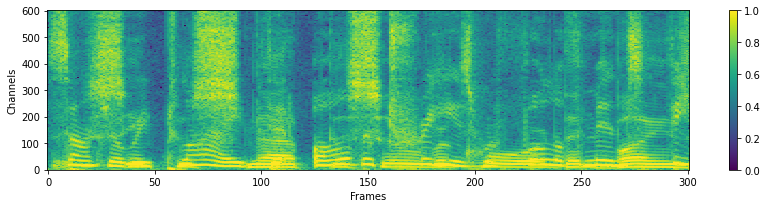

attacked:


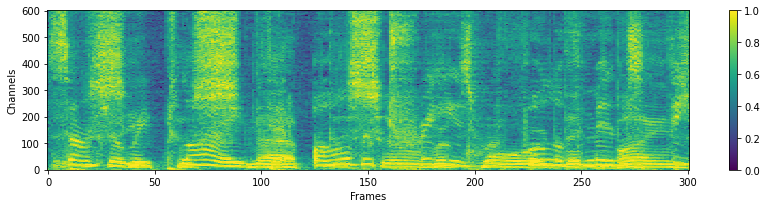

diff:


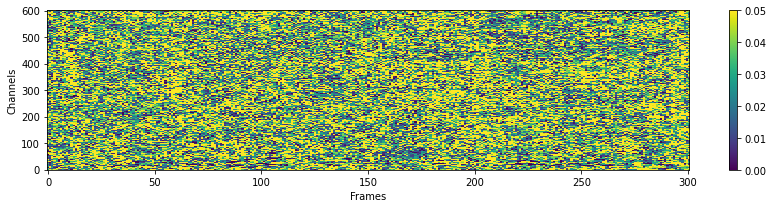

----------------compare end----------------------------------------
test_loss = 0.04891831800341606
SDR = -4.443197463016981
data/mixed_spectrogram


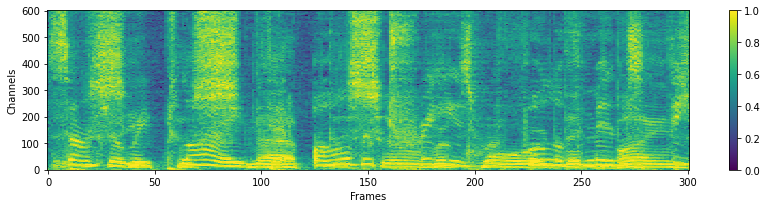

data/target_spectrogram


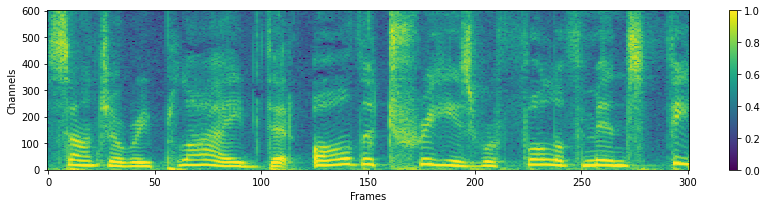

result/estimated_spectrogram


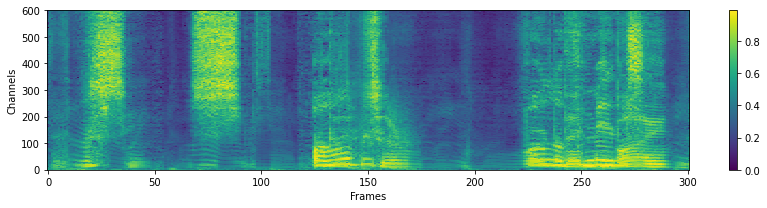

result/estimated_mask


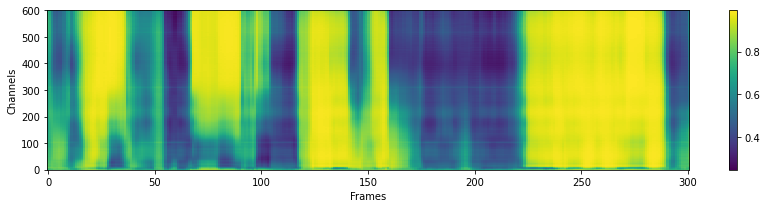

result/estimation_error_sq


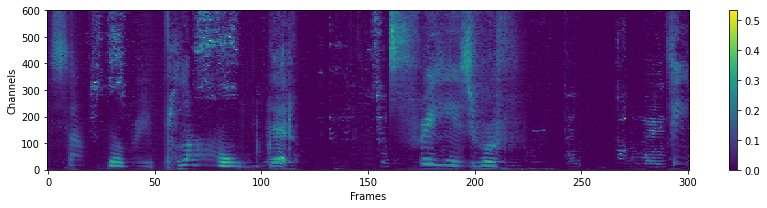

In [60]:
test(args, attackMixedOnly)

### Random Baseline

In [56]:
def attackRandom(model, mixed_mag, embedder, dvec_mel):
    eps = 0.05
    adv_mixed = torch.clamp(mixed_mag + torch.clamp(torch.randn_like(mixed_mag), min=0, max=1)  * eps, min=0, max=1)
    
    show_difference(mixed_mag, adv_mixed)
    return adv_mixed, dvec_mel

---------------difference between attacked and origin--------------
origin:


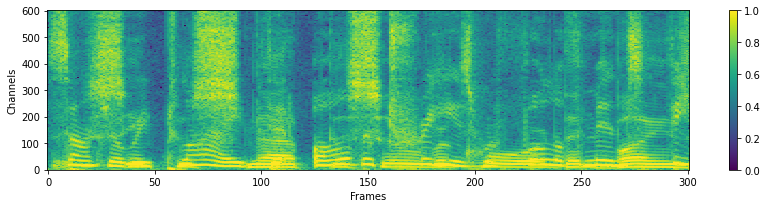

attacked:


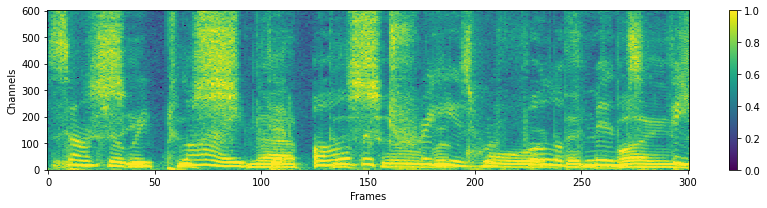

diff:


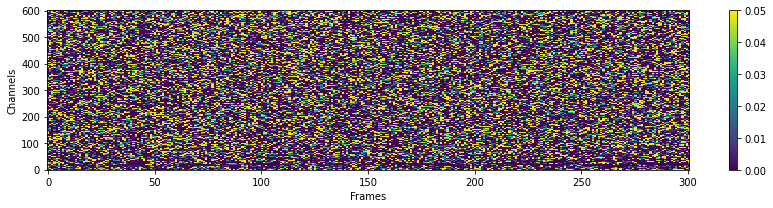

----------------compare end----------------------------------------
test_loss = 0.007771909702569246
SDR = 2.5854114051078403
data/mixed_spectrogram


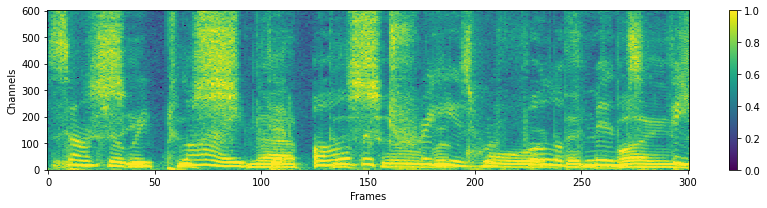

data/target_spectrogram


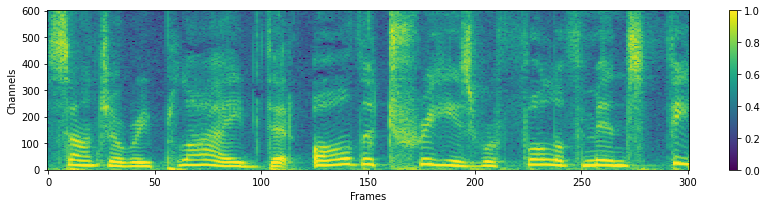

result/estimated_spectrogram


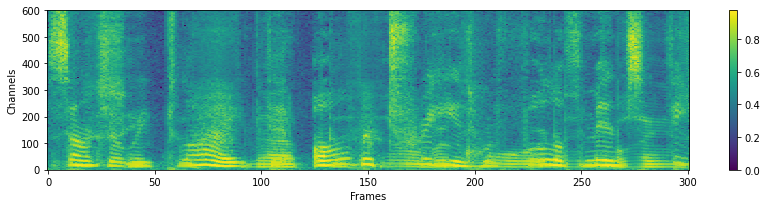

result/estimated_mask


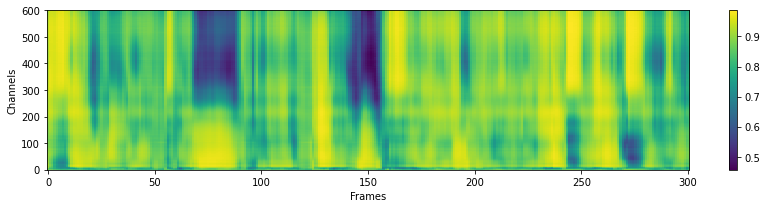

result/estimation_error_sq


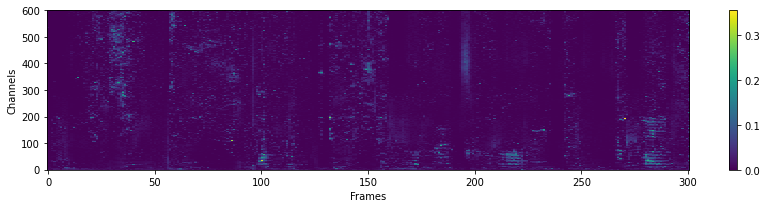

In [55]:
test(args, attackRandom)

# Gray Box Attack

In [57]:
def attackMixedNoDvec(model, mixed_mag, embedder, dvec_mel):
    with torch.no_grad():
        dvec = embedder(dvec_mel)
        dvec = dvec.unsqueeze(0)
    attack = PGD(model, eps=0.05, alpha=0.01, steps=7, random_start=True)
    dvec = torch.randn_like(dvec) * (0.02**0.5)
    with torch.enable_grad():
        adv_mixed = attack(mixed_mag, dvec)
    
    show_difference(mixed_mag, adv_mixed)
    return adv_mixed, dvec_mel

---------------difference between attacked and origin--------------
origin:


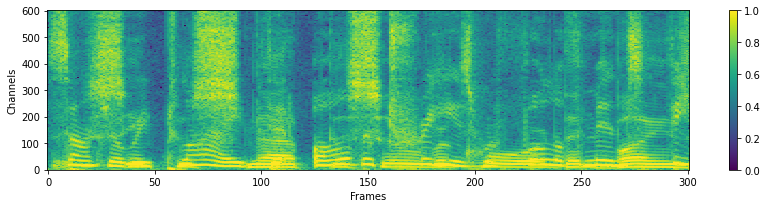

attacked:


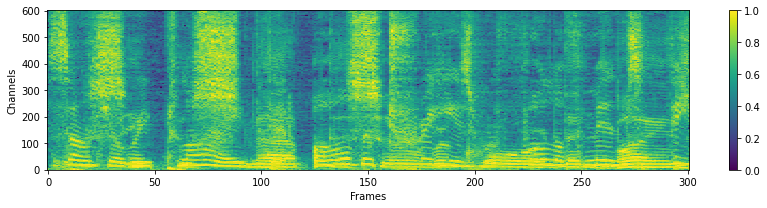

diff:


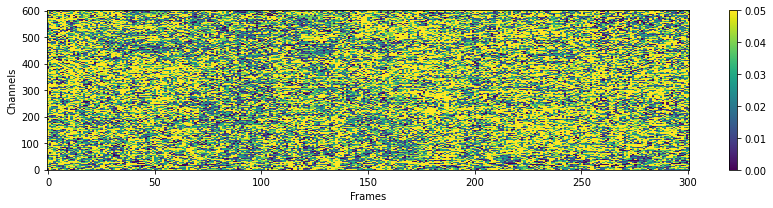

----------------compare end----------------------------------------
test_loss = 0.04974007233977318
SDR = -2.9562929056118987
data/mixed_spectrogram


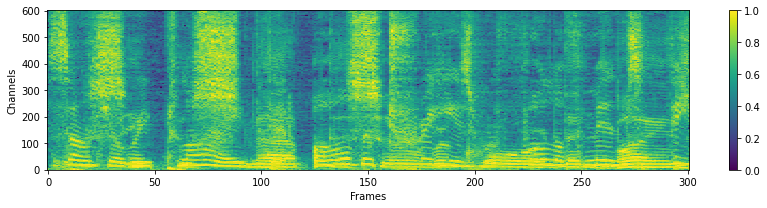

data/target_spectrogram


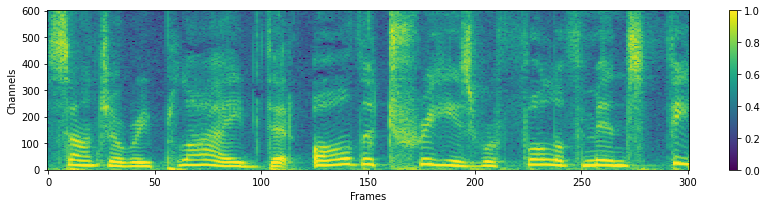

result/estimated_spectrogram


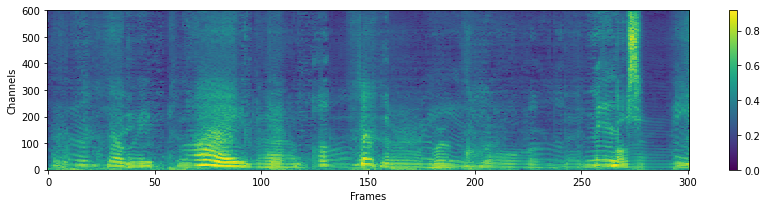

result/estimated_mask


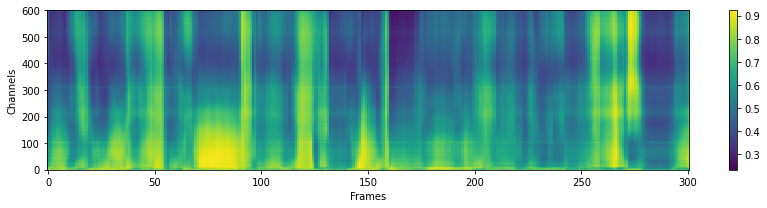

result/estimation_error_sq


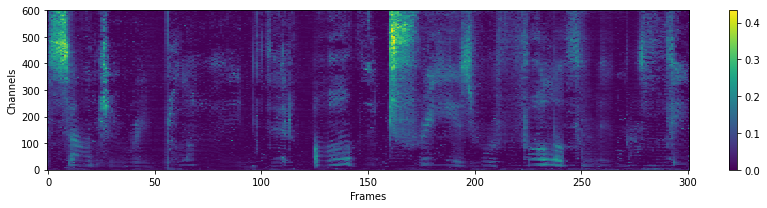

In [73]:
test(args, attackMixedNoDvec)

# Black Box Attack

In [10]:
# load model
hp = HParam(args.config)
model_2 = VoiceFilter(hp).cuda()
chkpt_model = torch.load(model2_path)['model']
model_2.load_state_dict(chkpt_model)
model_2 = model_2.eval()

/home/kailu/voicefilter/utils/hparams.py:18: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  for doc in docs:


VoiceFilter(
  (conv): Sequential(
    (0): ZeroPad2d(padding=(3, 3, 0, 0), value=0.0)
    (1): Conv2d(1, 64, kernel_size=(1, 7), stride=(1, 1))
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): ZeroPad2d(padding=(0, 0, 3, 3), value=0.0)
    (5): Conv2d(64, 64, kernel_size=(7, 1), stride=(1, 1))
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU()
    (8): ZeroPad2d(padding=(2, 2, 2, 2), value=0.0)
    (9): Conv2d(64, 64, kernel_size=(5, 5), stride=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ZeroPad2d(padding=(2, 2, 4, 4), value=0.0)
    (13): Conv2d(64, 64, kernel_size=(5, 5), stride=(1, 1), dilation=(2, 1))
    (14): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (15): ReLU()
    (16): ZeroPad2d(padding=(2, 2, 8, 8), value=0.0)
    (17): Conv2d(64, 64, k

### Targeted PGD

In [54]:
class PGD_targeted(Attack):
    """
    Modified from PGD in torchattacks, maximize difference of output
    """
    def __init__(self, model, eps=0.3, alpha=2/255, steps=40, random_start=False, targeted=True):
        super(PGD_targeted, self).__init__("PGD", model)
        self.eps = eps
        self.alpha = alpha
        self.steps = steps
        self.random_start = random_start
        self.sign = 1
        if targeted:
            self.sign = -1

    def forward(self, images, dvec):
        images = images.to(self.device)
        with torch.no_grad():
            labels = self.model(images, dvec)
            labels = torch.zeros_like(labels)
        loss = nn.MSELoss()

        adv_images = images.clone().detach()

        if self.random_start:
            # Starting at a uniformly random point
            adv_images = adv_images + torch.empty_like(adv_images).uniform_(-self.eps, self.eps)
            adv_images = torch.clamp(adv_images, min=0, max=1)
        
        self.model.train()  #  RNN BP need train mode
        for m in self.model.modules():
            if isinstance(m, nn.BatchNorm2d):
                m.eval()
        
        cost = 0
        for i in range(self.steps):
            adv_images.requires_grad = True
            outputs = self.model(adv_images, dvec)

            cost = self.sign*loss(outputs, labels).to(self.device)

            grad = torch.autograd.grad(cost, adv_images,
                                       retain_graph=False, create_graph=False)[0]
            adv_images = adv_images.detach() + self.alpha*grad.sign()
            delta = torch.clamp(adv_images - images, min=-self.eps, max=self.eps)
            adv_images = torch.clamp(images + delta, min=0, max=1).detach()
        self.model.eval()
        return adv_images

In [58]:
def attackMixedBlack(model, mixed_mag, embedder, dvec_mel):
    with torch.no_grad():
        dvec = embedder(dvec_mel)
        dvec = dvec.unsqueeze(0)
    attack = PGD_targeted(model_2, eps=0.05, alpha=0.005, steps=50, random_start=True)
    dvec = torch.randn_like(dvec) * (0.02**0.5)
    with torch.enable_grad():
        adv_mixed = attack(mixed_mag, dvec)
    
    show_difference(mixed_mag, adv_mixed)
    
    return adv_mixed, dvec_mel

cost =  tensor(-0.0496, device='cuda:0', grad_fn=<MulBackward0>)
---------------difference between attacked and origin--------------
origin:


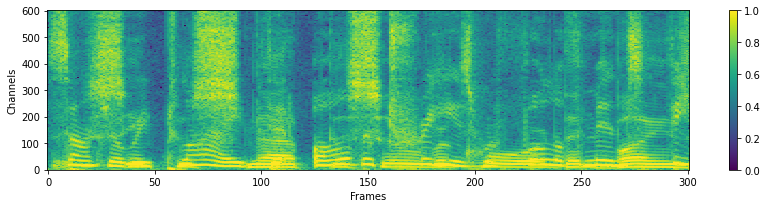

attacked:


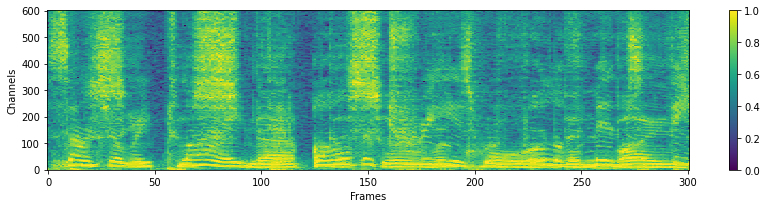

diff:


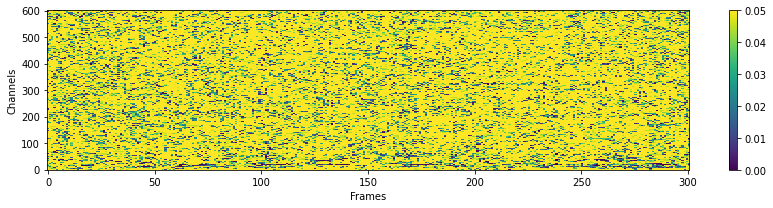

----------------compare end----------------------------------------
test_loss = 0.022351516410708427
SDR = -1.6213822882823643
data/mixed_spectrogram


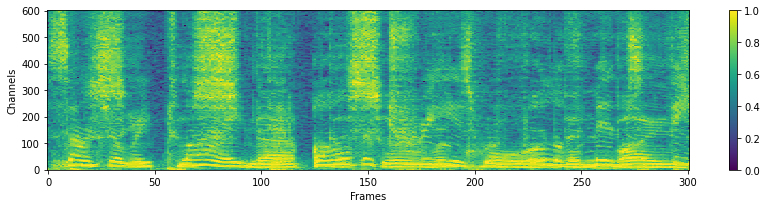

data/target_spectrogram


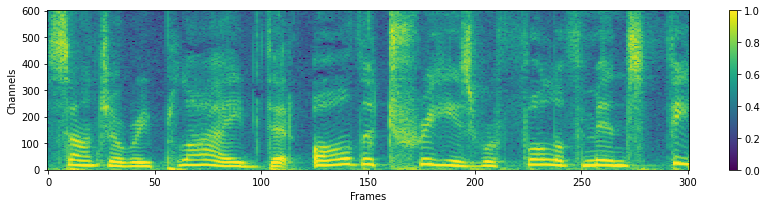

result/estimated_spectrogram


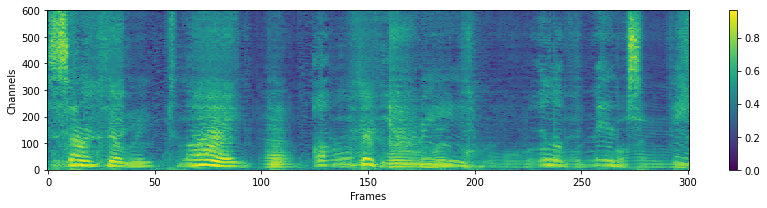

result/estimated_mask


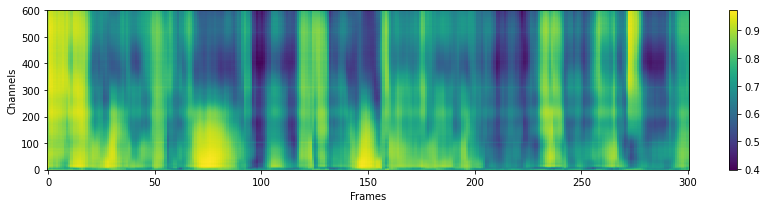

result/estimation_error_sq


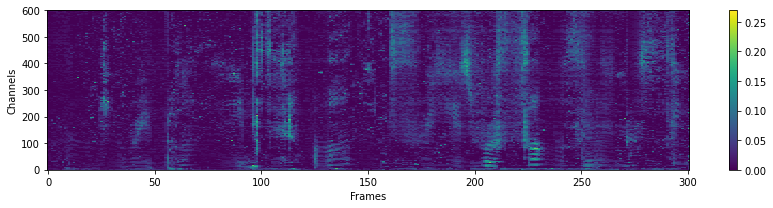

In [295]:
test(args, attackMixedBlack)

## Adversarial Attack with time-shift

### Baseline
* 普通 Attack 在 Time-shift 下的情况

In [59]:
shift_time = 5  # number of frames
def attackTimeShift(model, mixed_mag, embedder, dvec_mel):
    with torch.no_grad():
        dvec = embedder(dvec_mel)
        dvec = dvec.unsqueeze(0)
    attack = PGD_targeted(model_2, eps=0.05, alpha=0.01, steps=10, random_start=True)
    dvec = torch.randn_like(dvec) * (0.02**0.5)
    with torch.enable_grad():
        adv_mixed = attack(mixed_mag, dvec)
    with torch.no_grad():
        diff = adv_mixed - mixed_mag
        diff[:,shift_time:,:] = diff[:,:diff.size(1)-shift_time,:].clone()
        diff[:,:shift_time,:] = 0
        adv_mixed = mixed_mag + diff
    
    show_difference(mixed_mag, adv_mixed)
    
    return adv_mixed, dvec_mel

cost =  tensor(-0.1491, device='cuda:0', grad_fn=<MulBackward0>)
---------------difference between attacked and origin--------------
origin:


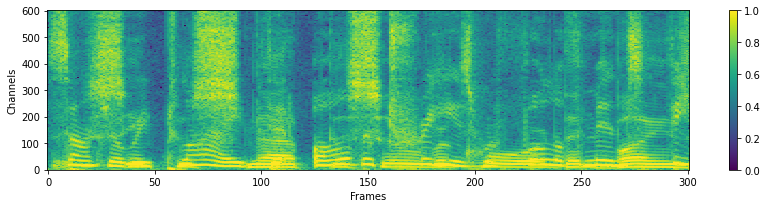

attacked:


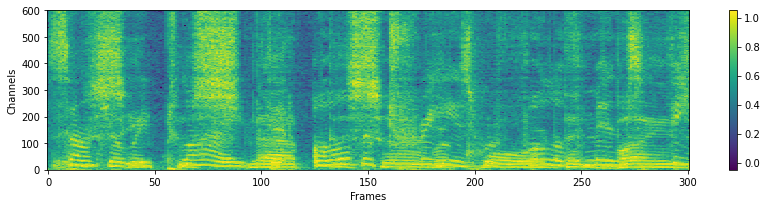

diff:


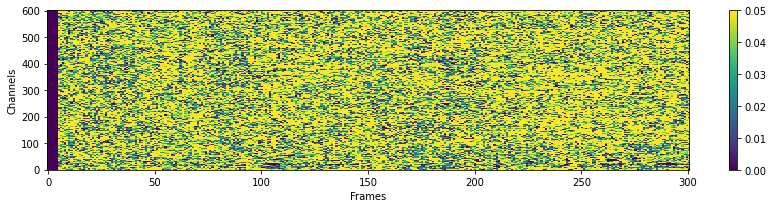

----------------compare end----------------------------------------
test_loss = 0.012120811268687248
SDR = 1.5740352344527677
data/mixed_spectrogram


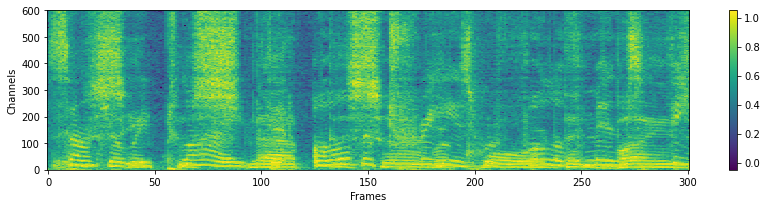

data/target_spectrogram


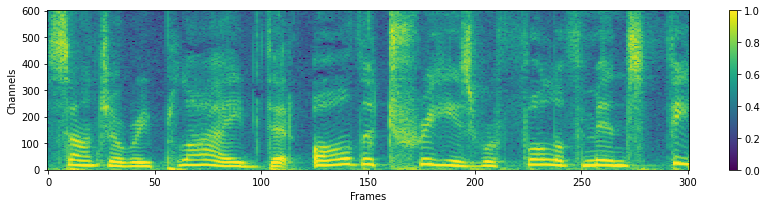

result/estimated_spectrogram


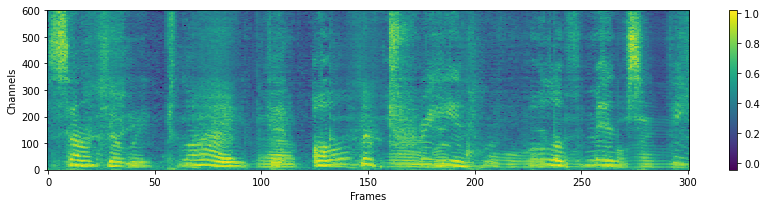

result/estimated_mask


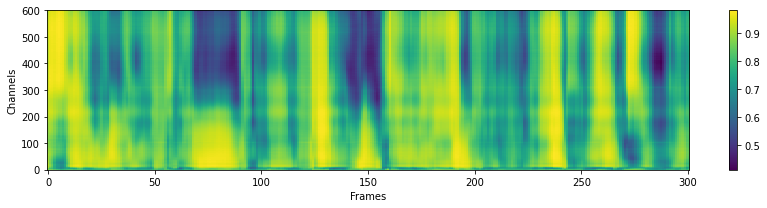

result/estimation_error_sq


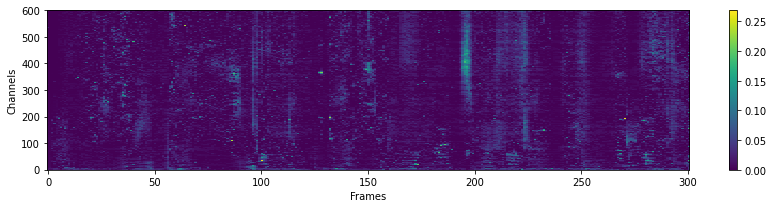

In [301]:
test(args, attackTimeShift)

### Targeted PGD with Time-Shift

In [14]:
class PGD_targeted_with_time(Attack):
    """
    Modified from PGD in torchattacks, maximize difference of output
    """
    def __init__(self, model, eps=0.3, alpha=2/255, steps=40, random_start=False, targeted=True):
        super().__init__("PGD", model)
        self.eps = eps
        self.alpha = alpha
        self.steps = steps
        self.random_start = random_start
        self.sign = 1
        if targeted:
            self.sign = -1

    def forward(self, images, dvec, time_shift=5):
        images = images.to(self.device)
        with torch.no_grad():
            labels = self.model(images, dvec)
            labels = torch.zeros_like(labels)
        loss = nn.MSELoss()

        adv_effects = torch.zeros_like(images)

        if self.random_start:
            # Starting at a uniformly random point
            adv_effects = torch.empty_like(adv_effects).uniform_(-self.eps, self.eps)
        
        self.model.train()  #  RNN BP need train mode
        for m in self.model.modules():
            if isinstance(m, nn.BatchNorm2d):
                m.eval()
        
        for i in range(self.steps):
            grad = 0
            adv_effects.requires_grad = True
            for t in range(time_shift+1):
                cost = 0
                shifted_effects = torch.zeros_like(adv_effects)
                shifted_effects[:,t:] = adv_effects[:, :adv_effects.size(1)-t]
                adv_images = torch.clamp(images+shifted_effects, min=0, max=1)
                
                outputs = self.model(adv_images, dvec)
                cost = self.sign*loss(outputs, labels).to(self.device)
                grad += torch.autograd.grad(cost, adv_effects, retain_graph=False, create_graph=False)[0]
            
            adv_effects = adv_effects.detach() + self.alpha*grad.sign()
            adv_effects = torch.clamp(adv_effects, min=-self.eps, max=self.eps)
            
        self.model.eval()
        return adv_effects + images

In [60]:
def attackForTimeShift(shift_frames):
    def attackForTimeShiftWithTimeShift(model, mixed_mag, embedder, dvec_mel):
        with torch.no_grad():
            dvec = embedder(dvec_mel)
            dvec = dvec.unsqueeze(0)
        dvec = torch.randn_like(dvec) * (0.02**0.5)
        attack = PGD_targeted_with_time(model_2, eps=0.05, alpha=0.01, steps=10, random_start=True)

        with torch.enable_grad():
            adv_mixed = attack(mixed_mag, dvec, time_shift=shift_frames)
        with torch.no_grad():
            import random
            t = random.randint(0, shift_frames)
            print(f"shifting {t} frames")
            diff = adv_mixed - mixed_mag
            diff[:,t:] = diff[:,:diff.size(1)-t].clone()
            diff[:,:t] = 0
            adv_mixed = mixed_mag + diff

        show_difference(mixed_mag, adv_mixed)

        return adv_mixed, dvec_mel
    return attackForTimeShiftWithTimeShift

shifting 0 frames
---------------difference between attacked and origin--------------
origin:


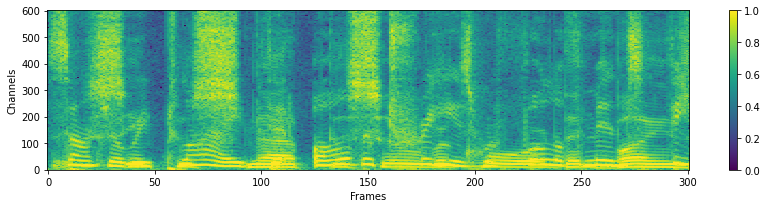

attacked:


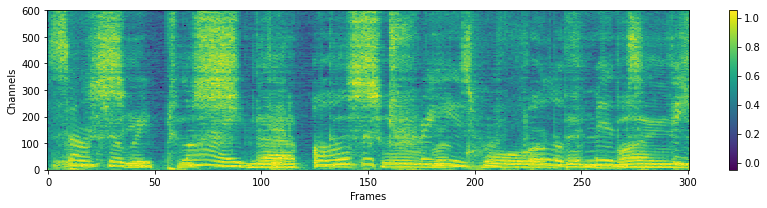

diff:


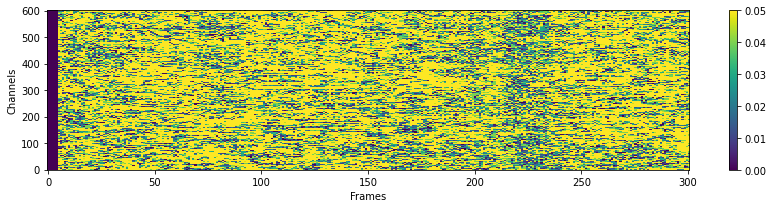

----------------compare end----------------------------------------
test_loss = 0.02687641978263855
SDR = -1.7507290707027297
data/mixed_spectrogram


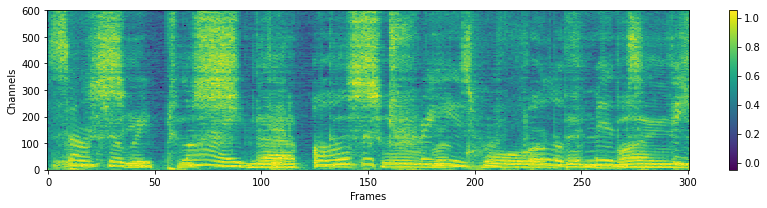

data/target_spectrogram


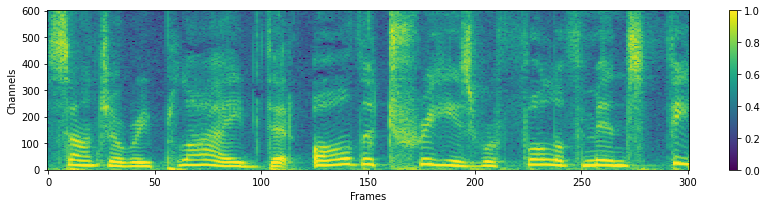

result/estimated_spectrogram


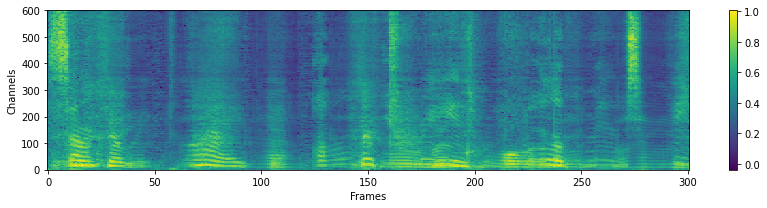

result/estimated_mask


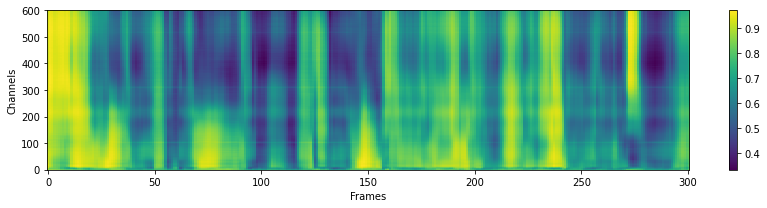

result/estimation_error_sq


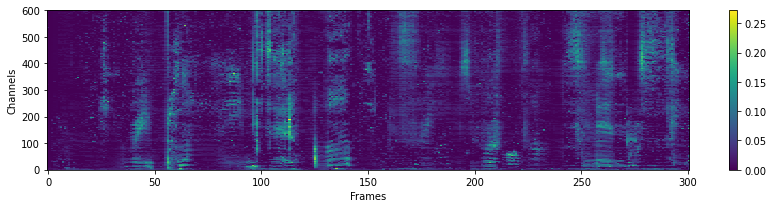

In [16]:
test(args, attackForTimeShift(5))

/home/kailu/voicefilter/utils/hparams.py:18: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  for doc in docs:


shifting 10 frames
---------------difference between attacked and origin--------------
origin:


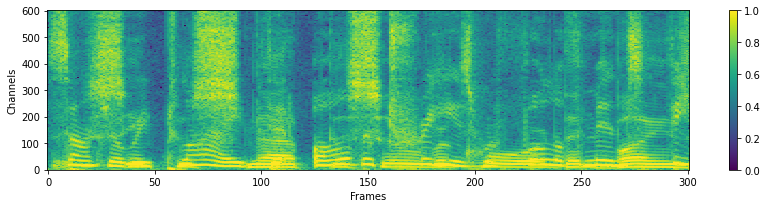

attacked:


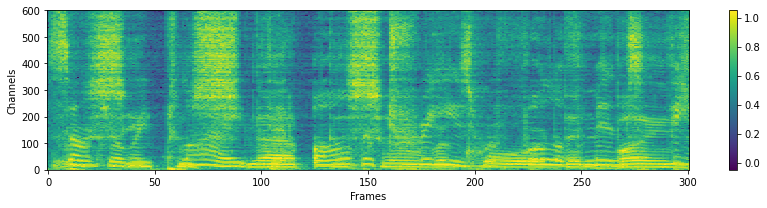

diff:


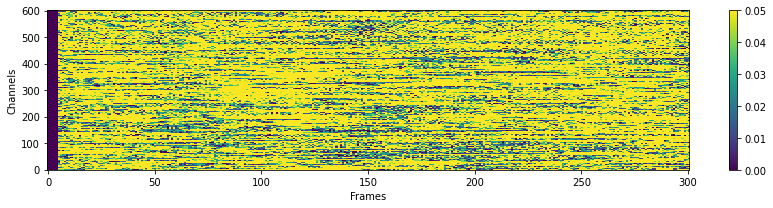

----------------compare end----------------------------------------
test_loss = 0.017550013959407806
SDR = 0.914067968580341
data/mixed_spectrogram


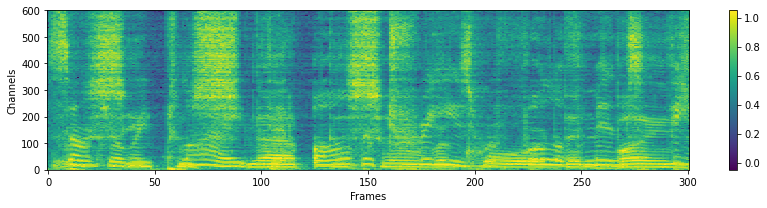

data/target_spectrogram


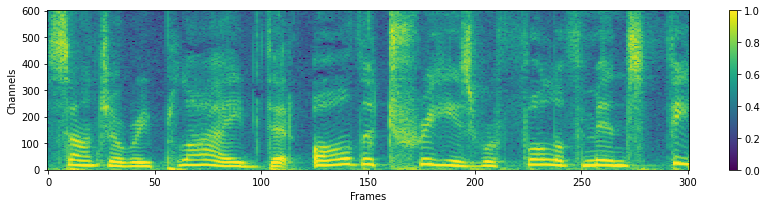

result/estimated_spectrogram


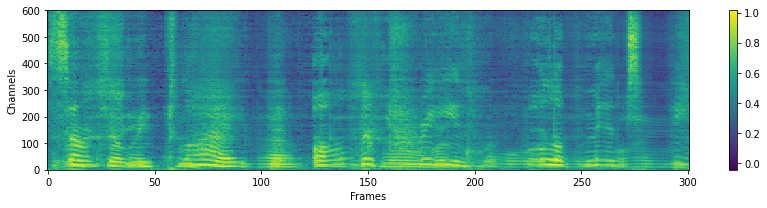

result/estimated_mask


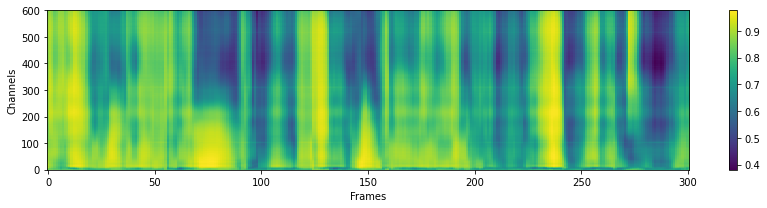

result/estimation_error_sq


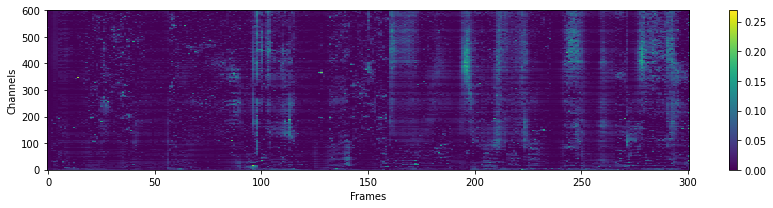

In [17]:
test(args, attackForTimeShift(30))

shifting 12 frames
---------------difference between attacked and origin--------------
origin:


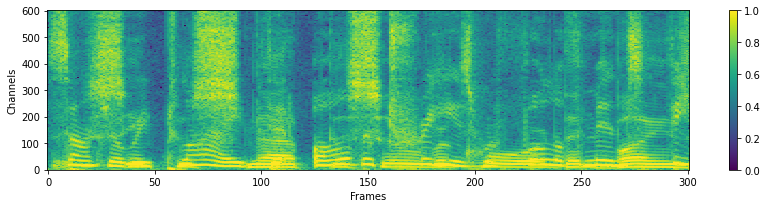

attacked:


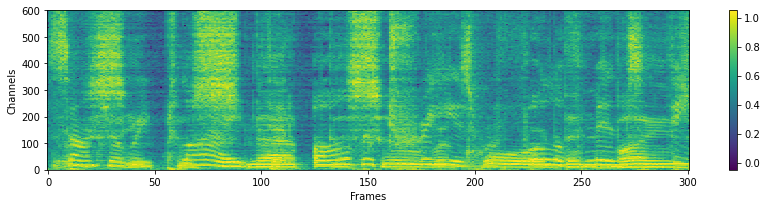

diff:


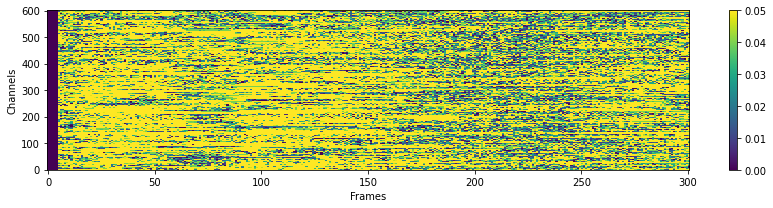

----------------compare end----------------------------------------
test_loss = 0.016580449417233467
SDR = 0.03319258319824789
data/mixed_spectrogram


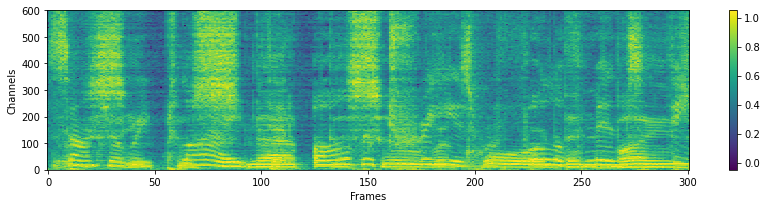

data/target_spectrogram


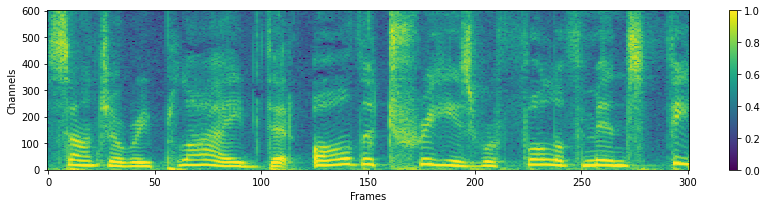

result/estimated_spectrogram


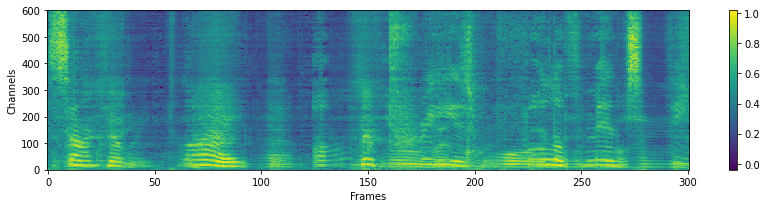

result/estimated_mask


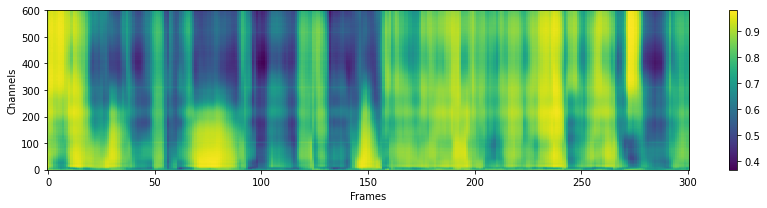

result/estimation_error_sq


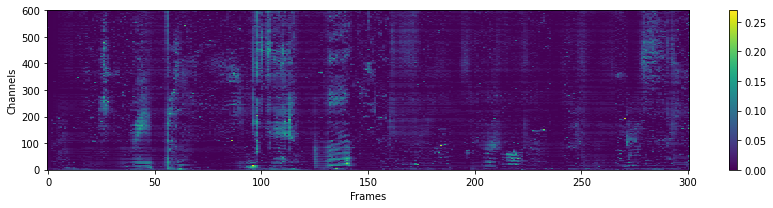

In [18]:
test(args, attackForTimeShift(50))

### Time-Invariant Attack

In [23]:
class PGD_targeted_timeless(Attack):
    """
    Modified from PGD in torchattacks, maximize difference of output
    """
    def __init__(self, model, eps=0.3, alpha=2/255, steps=40, random_start=False, targeted=True):
        super().__init__("PGD", model)
        self.eps = eps
        self.alpha = alpha
        self.steps = steps
        self.random_start = random_start
        self.sign = 1
        if targeted:
            self.sign = -1

    def forward(self, images, dvec):
        images = images.to(self.device)
        with torch.no_grad():
            labels = self.model(images, dvec)
            labels = torch.zeros_like(labels)
        loss = nn.MSELoss()

        adv_effects = torch.zeros_like(images)

        if self.random_start:
            # Starting at a uniformly random point
            adv_effects = torch.empty_like(adv_effects).uniform_(-self.eps, self.eps)
            adv_effects = adv_effects[:, 0]
        
        self.model.train()  #  RNN BP need train mode
        for m in self.model.modules():
            if isinstance(m, nn.BatchNorm2d):
                m.eval()
        
        for i in range(self.steps):
            grad = 0
            adv_effects.requires_grad = True
            
            cost = 0
            padded_effects = torch.stack([adv_effects]*images.size(1), dim=1)
            adv_images = torch.clamp(images+padded_effects, min=0, max=1)

            outputs = self.model(adv_images, dvec)
            cost = self.sign*loss(outputs, labels).to(self.device)
            grad += torch.autograd.grad(cost, adv_effects, retain_graph=False, create_graph=False)[0]
            
            adv_effects = adv_effects.detach() + self.alpha*grad.sign()
            adv_effects = torch.clamp(adv_effects, min=-self.eps, max=self.eps)
            
        self.model.eval()
        return adv_effects + images

In [61]:
def attackForArbitraryTimeShift(model, mixed_mag, embedder, dvec_mel):
    with torch.no_grad():
        dvec = embedder(dvec_mel)
        dvec = dvec.unsqueeze(0)
    dvec = torch.randn_like(dvec) * (0.02**0.5)
    attack = PGD_targeted_timeless(model_2, eps=0.05, alpha=0.01, steps=10, random_start=True)

    with torch.enable_grad():
        adv_mixed = attack(mixed_mag, dvec)

    show_difference(mixed_mag, adv_mixed)

    return adv_mixed, dvec_mel

---------------difference between attacked and origin--------------
origin:


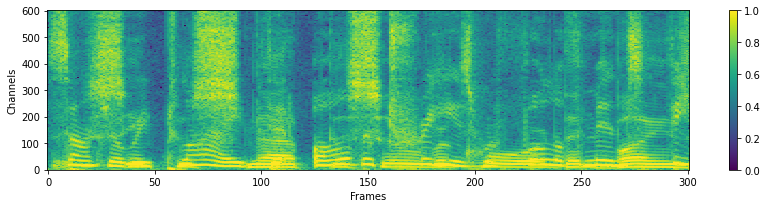

attacked:


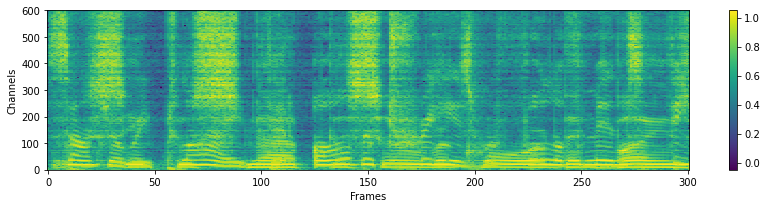

diff:


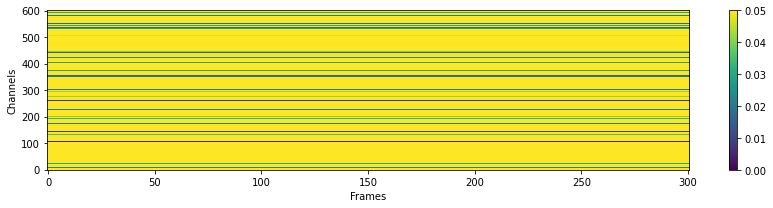

----------------compare end----------------------------------------
test_loss = 0.031439121812582016
SDR = -2.446530840946291
data/mixed_spectrogram


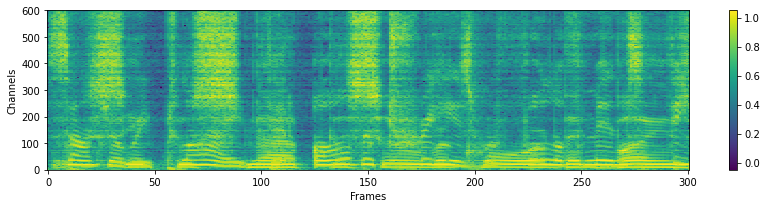

data/target_spectrogram


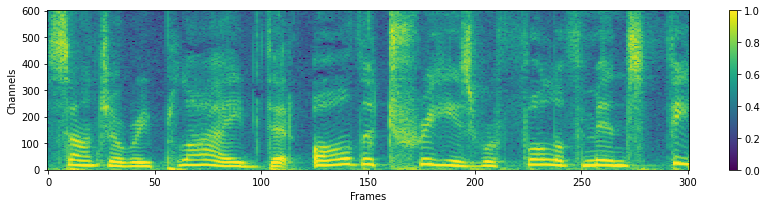

result/estimated_spectrogram


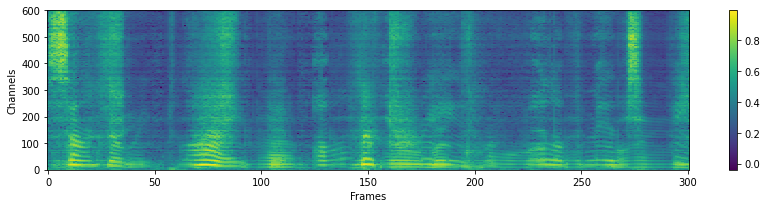

result/estimated_mask


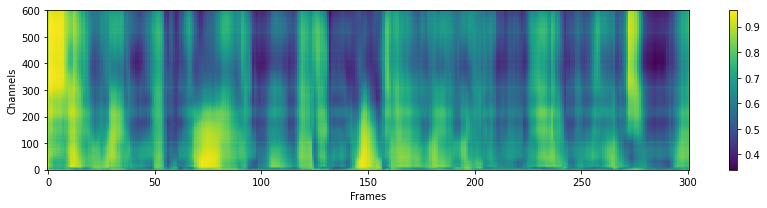

result/estimation_error_sq


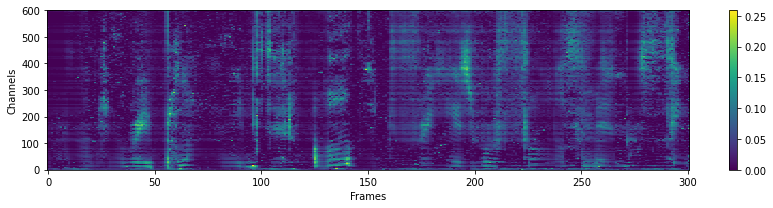

In [38]:
test(args, attackForArbitraryTimeShift)

# General Test

* 刚才都是在测试集的第一张图片上跑的可视化结果，接下来在整个测试集上测试平均效果，可能需要十几分钟

In [50]:
# 没有 Attack
test(args, noAttack, one_example=False, show_detail=False)

avg_loss =  0.01167456426226826
avg_sdr =  2.342792248392281


In [62]:
# White-box Attack
VERBOSE_DIFF = False
test(args, attackMixedOnly, one_example=False, show_detail=False)  # white box

avg_loss =  0.04857465749912297
avg_sdr =  -3.758259328878694


In [63]:
# Random Noise Baseline
test(args, attackRandom, one_example=False, show_detail=False)

avg_loss =  0.01229527363998454
avg_sdr =  2.2100083603357508


In [64]:
# Gray-box Attack
test(args, attackMixedNoDvec, one_example=False, show_detail=False)

avg_loss =  0.035915852051728696
avg_sdr =  -2.671519107214103


In [65]:
# Black-box Attack
test(args, attackMixedBlack, one_example=False, show_detail=False)

avg_loss =  0.017351569719056586
avg_sdr =  0.6104656579841805


In [66]:
# Black-box Attack baseline when there is randomly 0-5 frame shift
test(args, attackTimeShift, one_example=False, show_detail=False)

avg_loss =  0.013567210606007433
avg_sdr =  1.616799164701048


In [67]:
# Black-box Attack when we know there will be randomly 0-5 frame shift
# It's printing the frame shifts for each test example
test(args, attackForTimeShift(5), one_example=False, show_detail=False)

shifting 3 frames
shifting 0 frames
shifting 1 frames
shifting 2 frames
shifting 4 frames
shifting 5 frames
shifting 1 frames
shifting 4 frames
shifting 0 frames
shifting 0 frames
shifting 3 frames
shifting 3 frames
shifting 5 frames
shifting 5 frames
shifting 2 frames
shifting 4 frames
shifting 2 frames
shifting 5 frames
shifting 4 frames
shifting 2 frames
shifting 2 frames
shifting 1 frames
shifting 5 frames
shifting 0 frames
shifting 1 frames
shifting 5 frames
shifting 0 frames
shifting 4 frames
shifting 2 frames
shifting 3 frames
shifting 2 frames
shifting 0 frames
shifting 5 frames
shifting 4 frames
shifting 3 frames
shifting 4 frames
shifting 3 frames
shifting 1 frames
shifting 2 frames
shifting 5 frames
shifting 2 frames
shifting 4 frames
shifting 5 frames
shifting 1 frames
shifting 0 frames
shifting 2 frames
shifting 5 frames
shifting 4 frames
shifting 4 frames
shifting 0 frames
shifting 2 frames
shifting 0 frames
shifting 3 frames
shifting 4 frames
shifting 3 frames
shifting 2

In [69]:
# Black-box Attack when we know there will be randomly 0-30 frame shift
# It's printing the frame shifts for each test example
test(args, attackForTimeShift(30), one_example=False, show_detail=False)

shifting 7 frames
shifting 8 frames
shifting 30 frames
shifting 0 frames
shifting 15 frames
shifting 14 frames
shifting 22 frames
shifting 30 frames
shifting 15 frames
shifting 24 frames
shifting 12 frames
shifting 8 frames
shifting 22 frames
shifting 20 frames
shifting 6 frames
shifting 24 frames
shifting 7 frames
shifting 27 frames
shifting 24 frames
shifting 13 frames
shifting 29 frames
shifting 9 frames
shifting 20 frames
shifting 21 frames
shifting 24 frames
shifting 26 frames
shifting 2 frames
shifting 11 frames
shifting 2 frames
shifting 12 frames
shifting 10 frames
shifting 21 frames
shifting 0 frames
shifting 2 frames
shifting 2 frames
shifting 24 frames
shifting 5 frames
shifting 28 frames
shifting 8 frames
shifting 18 frames
shifting 28 frames
shifting 29 frames
shifting 22 frames
shifting 1 frames
shifting 8 frames
shifting 4 frames
shifting 18 frames
shifting 18 frames
shifting 16 frames
shifting 1 frames
shifting 17 frames
shifting 19 frames
shifting 29 frames
shifting 7 

In [70]:
# Black-box Attack when we know there will be randomly 0-50 frame shift
# It's printing the frame shifts for each test example
test(args, attackForTimeShift(50), one_example=False, show_detail=False)

shifting 31 frames
shifting 24 frames
shifting 15 frames
shifting 34 frames
shifting 23 frames
shifting 13 frames
shifting 33 frames
shifting 7 frames
shifting 26 frames
shifting 32 frames
shifting 36 frames
shifting 15 frames
shifting 33 frames
shifting 9 frames
shifting 48 frames
shifting 18 frames
shifting 30 frames
shifting 27 frames
shifting 38 frames
shifting 41 frames
shifting 7 frames
shifting 7 frames
shifting 14 frames
shifting 31 frames
shifting 38 frames
shifting 27 frames
shifting 29 frames
shifting 37 frames
shifting 39 frames
shifting 49 frames
shifting 28 frames
shifting 0 frames
shifting 46 frames
shifting 1 frames
shifting 18 frames
shifting 32 frames
shifting 15 frames
shifting 16 frames
shifting 9 frames
shifting 25 frames
shifting 2 frames
shifting 13 frames
shifting 14 frames
shifting 3 frames
shifting 13 frames
shifting 9 frames
shifting 24 frames
shifting 25 frames
shifting 18 frames
shifting 6 frames
shifting 9 frames
shifting 32 frames
shifting 26 frames
shift

In [71]:
# Time-Invariant Attack and there is no time-shifting operation on mixed audio since it's meaningless to the Time-Invariant Attack
test(args, attackForArbitraryTimeShift, one_example=False, show_detail=False)

avg_loss =  0.018190039780491322
avg_sdr =  1.2557354121302398
